# 09 — Diabetes Image Stress Test

 **Purpose:** Run the trained tongue segmentation model on the diabetes classification
 dataset as an external generalization test. No GT masks exist — Dice/IoU cannot be
 computed. This notebook produces classifier-ready outputs only.

 **This notebook does NOT:** train, alter the diabetes dataset, or claim classification improvement.


# 1  Imports

In [12]:
import os
import json
import time
import random
import numpy as np
import pandas as pd
import cv2

In [ ]:
import matplotlib.pyplot as plt
import torch
import torchvision.transforms.functional as TF


In [3]:
import segmentation_models_pytorch as smp
from pathlib import Path
from PIL import Image

print(f"torch  {torch.__version__}  |  smp  {smp.__version__}  |  CUDA  {torch.cuda.is_available()}")

c:\Users\cm\AppData\Local\Programs\Python\Python312\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


torch  2.5.1+cu121  |  smp  0.5.0  |  CUDA  True


# 2  Constants & Reproducibility

In [4]:
SEED = 42
random.seed(SEED)
np.random.seed(SEED)
torch.manual_seed(SEED)
if torch.cuda.is_available():
    torch.cuda.manual_seed_all(SEED)

OUTPUT_ROOT     = Path(r"D:\DIABETES\Segmentation_Dataset\Segmentation_Branch_Outputs")
CHECKPOINT_PATH = OUTPUT_ROOT / "05_training_runs" / "checkpoints" / "best_efficientnetb0_unet.pth"

DIABETES_DATASET_PATHS = [
    Path(r"D:\DIABETES\Type 2 Diabetes Mellitus Tongue Dataset"),
]

IMG_SIZE      = 384
THRESHOLD     = 0.5
DEVICE        = torch.device("cuda" if torch.cuda.is_available() else "cpu")
NUM_WORKERS   = 0

IMAGENET_MEAN = [0.485, 0.456, 0.406]
IMAGENET_STD  = [0.229, 0.224, 0.225]

VALID_EXTENSIONS = {".jpg", ".jpeg", ".png", ".bmp", ".tif", ".tiff"}

assert CHECKPOINT_PATH.exists(), (
    f"Checkpoint not found: {CHECKPOINT_PATH}\nRun Notebook 06 first."
)
for p in DIABETES_DATASET_PATHS:
    assert p.exists(), f"Diabetes dataset path not found: {p}"

print(f"Device      : {DEVICE}")
print(f"Checkpoint  : {CHECKPOINT_PATH.name}")
print(f"Dataset(s)  : {[str(p) for p in DIABETES_DATASET_PATHS]}")


Device      : cuda
Checkpoint  : best_efficientnetb0_unet.pth
Dataset(s)  : ['D:\\DIABETES\\Type 2 Diabetes Mellitus Tongue Dataset']


# 3  Create Output Folder Structure

In [5]:
STRESS_ROOT = OUTPUT_ROOT / "09_diabetes_stress_test"

DIRS = {
    "manifests"      : STRESS_ROOT / "manifests",
    "predicted_masks": STRESS_ROOT / "predicted_masks",
    "black_background": STRESS_ROOT / "black_background",
    "bbox_crops"     : STRESS_ROOT / "bbox_crops",
    "crop_masked"    : STRESS_ROOT / "crop_masked",
    "visual_audits"  : STRESS_ROOT / "visual_audits",
    "reports"        : STRESS_ROOT / "reports",
    "suspicious_cases": STRESS_ROOT / "suspicious_cases",
}

for key, d in DIRS.items():
    d.mkdir(parents=True, exist_ok=True)
    print(f"Ready: {d}")


Ready: D:\DIABETES\Segmentation_Dataset\Segmentation_Branch_Outputs\09_diabetes_stress_test\manifests
Ready: D:\DIABETES\Segmentation_Dataset\Segmentation_Branch_Outputs\09_diabetes_stress_test\predicted_masks
Ready: D:\DIABETES\Segmentation_Dataset\Segmentation_Branch_Outputs\09_diabetes_stress_test\black_background
Ready: D:\DIABETES\Segmentation_Dataset\Segmentation_Branch_Outputs\09_diabetes_stress_test\bbox_crops
Ready: D:\DIABETES\Segmentation_Dataset\Segmentation_Branch_Outputs\09_diabetes_stress_test\crop_masked
Ready: D:\DIABETES\Segmentation_Dataset\Segmentation_Branch_Outputs\09_diabetes_stress_test\visual_audits
Ready: D:\DIABETES\Segmentation_Dataset\Segmentation_Branch_Outputs\09_diabetes_stress_test\reports
Ready: D:\DIABETES\Segmentation_Dataset\Segmentation_Branch_Outputs\09_diabetes_stress_test\suspicious_cases


# 4  Build Diabetes Image Manifest

 Recursively scans each dataset path. Infers split_name and class_name
 from folder structure: `<dataset_root>/<split>/<class>/<image>`.
 No class labels are passed to the segmentation model.

In [6]:
def infer_split_and_class(image_path: Path, dataset_root: Path):
    """
    Infer split_name and class_name from relative path components.
    Expected structure: <root>/<split_name>/<class_name>/<filename>
    Returns (split_name, class_name) or ("unknown", "unknown") on failure.
    """
    try:
        rel   = image_path.relative_to(dataset_root)
        parts = list(rel.parts)
        split = parts[0] if len(parts) >= 1 else "unknown"
        cls   = parts[1] if len(parts) >= 2 else "unknown"
        return split, cls
    except Exception:
        return "unknown", "unknown"


def read_image_size(path: Path):
    try:
        with Image.open(path) as img:
            return img.size   # (width, height)
    except Exception:
        return None, None


input_records = []
idx = 0

for dataset_root in DIABETES_DATASET_PATHS:
    source_name = dataset_root.name
    for img_path in sorted(dataset_root.rglob("*")):
        if not img_path.is_file():
            continue
        if img_path.suffix.lower() not in VALID_EXTENSIONS:
            continue

        split_name, class_name = infer_split_and_class(img_path, dataset_root)
        img_w, img_h = read_image_size(img_path)

        sample_id = f"{idx:06d}_{img_path.stem}"
        input_records.append({
            "sample_id"     : sample_id,
            "source_dataset": source_name,
            "split_name"    : split_name,
            "class_name"    : class_name,
            "image_path"    : str(img_path),
            "image_filename": img_path.name,
            "image_width"   : img_w,
            "image_height"  : img_h,
        })
        idx += 1

input_df = pd.DataFrame(input_records)
print(f"Total diabetes images found : {len(input_df)}")
print(input_df.groupby(["split_name", "class_name"]).size().to_string())

Total diabetes images found : 3758
split_name  class_name 
test        diabetes         25
            nondiabetes      25
train       diabetes       1556
            nondiabetes    1552
valid       diabetes        300
            nondiabetes     300


# 5  Save Input Manifest

In [7]:
INPUT_MANIFEST_PATH = DIRS["manifests"] / "diabetes_stress_test_input_manifest.csv"
input_df.to_csv(INPUT_MANIFEST_PATH, index=False)
print(f"Input manifest saved -> {INPUT_MANIFEST_PATH}")

Input manifest saved -> D:\DIABETES\Segmentation_Dataset\Segmentation_Branch_Outputs\09_diabetes_stress_test\manifests\diabetes_stress_test_input_manifest.csv


# 6  Inference Helper Functions

In [15]:
def run_single_image_inference(image_path: str, model, device, save_dirs: dict,
                                sample_id: str, split_name: str, class_name: str,
                                img_size: int = 384, threshold: float = 0.5):
    """
    Full inference pipeline for one image.
    Returns result dict with paths, QC metrics, and status flags.
    """
    result = {
        "sample_id"            : sample_id,
        "image_path"           : image_path,
        "split_name"           : split_name,
        "class_name"           : class_name,
        "pred_mask_path"       : "",
        "black_bg_path"        : "",
        "bbox_crop_path"       : "",
        "crop_masked_path"     : "",
        "mask_foreground_pixels": 0,
        "mask_foreground_ratio": 0.0,
        "bbox_x1"              : None,
        "bbox_y1"              : None,
        "bbox_x2"              : None,
        "bbox_y2"              : None,
        "bbox_width"           : None,
        "bbox_height"          : None,
        "bbox_area_ratio"      : None,
        "touches_top"          : False,
        "touches_bottom"       : False,
        "touches_left"         : False,
        "touches_right"        : False,
        "num_connected_components": None,
        "inference_ms"         : None,
        "status"               : "failed_unknown",
        "error"                : "",
    }

    try:
        # Load original image
        orig_pil  = Image.open(image_path).convert("RGB")
        orig_w, orig_h = orig_pil.size
        orig_arr  = np.array(orig_pil)
        total_px  = orig_w * orig_h

        # Preprocess & time inference
        tensor = preprocess_image(image_path, img_size)
        t0     = time.perf_counter()
        _, binary_mask_small = predict_mask(model, tensor, device, threshold)
        if device.type == "cuda":
            torch.cuda.synchronize()
        t1 = time.perf_counter()
        result["inference_ms"] = round((t1 - t0) * 1000, 2)

        # Keep largest component
        binary_mask_small, n_comp = keep_largest_component(binary_mask_small)
        result["num_connected_components"] = n_comp

        # Resize mask to original resolution (nearest-neighbor)
        mask_pil_orig = Image.fromarray(binary_mask_small).resize(
            (orig_w, orig_h), resample=Image.NEAREST)
        mask_orig = np.array(mask_pil_orig)

        # QC metrics
        fg_px    = int((mask_orig == 255).sum())
        fg_ratio = fg_px / total_px if total_px > 0 else 0.0
        result["mask_foreground_pixels"] = fg_px
        result["mask_foreground_ratio"]  = round(fg_ratio, 6)

        _, _, bbox = crop_to_mask_bbox(orig_arr, mask_orig)
        if bbox is not None:
            y1, y2, x1, x2 = bbox
            bw = int(x2 - x1); bh = int(y2 - y1)
            result.update({
                "bbox_x1": int(x1), "bbox_y1": int(y1),
                "bbox_x2": int(x2), "bbox_y2": int(y2),
                "bbox_width": bw,   "bbox_height": bh,
                "bbox_area_ratio": round((bw * bh) / total_px, 6) if total_px > 0 else 0.0,
                "touches_top"   : bool(y1 == 0),
                "touches_bottom": bool(y2 >= orig_h),
                "touches_left"  : bool(x1 == 0),
                "touches_right" : bool(x2 >= orig_w),
            })
        else:
            result.update({
                "bbox_x1": 0, "bbox_y1": 0, "bbox_x2": 0, "bbox_y2": 0,
                "bbox_width": 0, "bbox_height": 0, "bbox_area_ratio": 0.0,
                "touches_top": False, "touches_bottom": False,
                "touches_left": False, "touches_right": False,
            })

        # Generate outputs
        black_bg       = create_black_background_tongue(orig_arr, mask_orig)
        crop_img, crop_mask, _ = crop_to_mask_bbox(orig_arr, mask_orig)
        crop_masked    = create_black_background_tongue(crop_img, crop_mask)

        # Save — subdirs by split/class
        for key in ["predicted_masks", "black_background", "bbox_crops", "crop_masked"]:
            (save_dirs[key] / split_name / class_name).mkdir(parents=True, exist_ok=True)

        mask_save   = save_dirs["predicted_masks"]  / split_name / class_name / f"{sample_id}_mask.png"
        black_save  = save_dirs["black_background"] / split_name / class_name / f"{sample_id}_black_bg.png"
        crop_save   = save_dirs["bbox_crops"]       / split_name / class_name / f"{sample_id}_bbox_crop.png"
        cmask_save  = save_dirs["crop_masked"]      / split_name / class_name / f"{sample_id}_crop_masked.png"

        Image.fromarray(mask_orig).save(str(mask_save))
        Image.fromarray(black_bg).save(str(black_save))
        Image.fromarray(crop_img).save(str(crop_save))
        Image.fromarray(crop_masked).save(str(cmask_save))

        result["pred_mask_path"]   = str(mask_save)
        result["black_bg_path"]    = str(black_save)
        result["bbox_crop_path"]   = str(crop_save)
        result["crop_masked_path"] = str(cmask_save)

        # Suspicious-case classification
        flags = []
        if fg_px == 0:
            flags.append("failed_no_mask")
        if fg_ratio < 0.02 and fg_px > 0:
            flags.append("suspicious_small_mask")
        if fg_ratio > 0.85:
            flags.append("suspicious_large_mask")
        if result["bbox_area_ratio"] is not None and result["bbox_area_ratio"] < 0.02 and fg_px > 0:
            flags.append("suspicious_tiny_bbox")
        edge_count = sum([
            result["touches_top"], result["touches_bottom"],
            result["touches_left"], result["touches_right"]
        ])
        if edge_count >= 3:
            flags.append("suspicious_edge_touch")

        result["status"] = "ok" if len(flags) == 0 else "|".join(flags)

    except Exception as e:
        result["status"] = "failed_exception"
        result["error"]  = str(e)

    return result
print("All inference functions defined.")


All inference functions defined.


# 7  Load Segmentation Model

In [16]:
model = load_segmentation_model(CHECKPOINT_PATH, DEVICE)

C:\Users\cm\AppData\Local\Temp\ipykernel_8180\1726721646.py:13: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  ckpt = torch.load(checkpoint_path, map_location=device)


Model loaded — epoch 40  val_dice=0.9935


# 8  Run Inference on All Diabetes Images

In [17]:
SAVE_DIRS = {
    "predicted_masks" : DIRS["predicted_masks"],
    "black_background": DIRS["black_background"],
    "bbox_crops"      : DIRS["bbox_crops"],
    "crop_masked"     : DIRS["crop_masked"],
}

output_records = []
n_total  = len(input_df)
n_done   = 0

print(f"Starting inference on {n_total} images...")
print("Existing outputs will be skipped (resume mode).")

for _, row in input_df.iterrows():
    result = run_single_image_inference(
        image_path  =row["image_path"],
        model       =model,
        device      =DEVICE,
        save_dirs   =SAVE_DIRS,
        sample_id   =row["sample_id"],
        split_name  =row["split_name"],
        class_name  =row["class_name"],
        img_size    =IMG_SIZE,
        threshold   =THRESHOLD,
    )
    result["source_dataset"] = row["source_dataset"]
    result["image_filename"] = row["image_filename"]
    result["image_width"]    = row["image_width"]
    result["image_height"]   = row["image_height"]
    output_records.append(result)
    n_done += 1

    if n_done % 100 == 0 or n_done == n_total:
        n_ok      = sum(1 for r in output_records if r["status"] == "ok")
        n_fail    = sum(1 for r in output_records if "failed" in r["status"])
        n_skipped = sum(1 for r in output_records if r["status"] == "skipped_existing_outputs")
        print(f"  {n_done}/{n_total}  ok={n_ok}  failed={n_fail}  skipped={n_skipped}")

print(f"\nInference complete — {n_total} images processed.")

Starting inference on 3758 images...
Existing outputs will be skipped (resume mode).
  100/3758  ok=90  failed=0  skipped=0
  200/3758  ok=190  failed=0  skipped=0
  300/3758  ok=290  failed=0  skipped=0
  400/3758  ok=390  failed=0  skipped=0
  500/3758  ok=490  failed=0  skipped=0
  600/3758  ok=577  failed=0  skipped=0
  700/3758  ok=669  failed=0  skipped=0
  800/3758  ok=744  failed=0  skipped=0
  900/3758  ok=834  failed=0  skipped=0
  1000/3758  ok=910  failed=0  skipped=0
  1100/3758  ok=993  failed=0  skipped=0
  1200/3758  ok=1071  failed=0  skipped=0
  1300/3758  ok=1157  failed=0  skipped=0
  1400/3758  ok=1241  failed=0  skipped=0
  1500/3758  ok=1305  failed=0  skipped=0
  1600/3758  ok=1387  failed=0  skipped=0
  1700/3758  ok=1487  failed=0  skipped=0
  1800/3758  ok=1587  failed=0  skipped=0
  1900/3758  ok=1682  failed=0  skipped=0
  2000/3758  ok=1781  failed=0  skipped=0
  2100/3758  ok=1880  failed=0  skipped=0
  2200/3758  ok=1962  failed=0  skipped=0
  2300/3758 

# 9  Build Output DataFrame

In [18]:
output_df = pd.DataFrame(output_records)
print(f"Output manifest rows: {len(output_df)}")
print(output_df["status"].value_counts().to_string())

Output manifest rows: 3758
status
ok                                             3307
suspicious_edge_touch                           406
suspicious_large_mask|suspicious_edge_touch      25
suspicious_large_mask                            20


# 10  Save Output Manifest

In [19]:
OUTPUT_MANIFEST_PATH = DIRS["manifests"] / "diabetes_stress_test_output_manifest.csv"
output_df.to_csv(OUTPUT_MANIFEST_PATH, index=False)
print(f"Output manifest saved -> {OUTPUT_MANIFEST_PATH}")

Output manifest saved -> D:\DIABETES\Segmentation_Dataset\Segmentation_Branch_Outputs\09_diabetes_stress_test\manifests\diabetes_stress_test_output_manifest.csv


# 11  Save Suspicious Cases CSV & Copies

In [20]:
susp_mask  = output_df["status"] != "ok"
susp_df    = output_df[susp_mask].reset_index(drop=True)
SUSP_CSV   = DIRS["reports"] / "diabetes_stress_test_suspicious_cases.csv"
susp_df.to_csv(SUSP_CSV, index=False)
print(f"Suspicious cases: {len(susp_df)}")
print(f"Saved -> {SUSP_CSV}")

# Copy suspicious masks to suspicious_cases folder for easy review
for _, row in susp_df.iterrows():
    src = row["pred_mask_path"]
    if src and Path(src).exists():
        dst = DIRS["suspicious_cases"] / Path(src).name
        import shutil
        shutil.copy2(src, dst)

print(f"Suspicious mask copies -> {DIRS['suspicious_cases']}")

Suspicious cases: 451
Saved -> D:\DIABETES\Segmentation_Dataset\Segmentation_Branch_Outputs\09_diabetes_stress_test\reports\diabetes_stress_test_suspicious_cases.csv
Suspicious mask copies -> D:\DIABETES\Segmentation_Dataset\Segmentation_Branch_Outputs\09_diabetes_stress_test\suspicious_cases


# 12  Summary Statistics

In [21]:
n_ok         = int((output_df["status"] == "ok").sum())
n_failed     = int(output_df["status"].str.contains("failed").sum())
n_small      = int(output_df["status"].str.contains("suspicious_small_mask").sum())
n_large      = int(output_df["status"].str.contains("suspicious_large_mask").sum())
n_tiny_bbox  = int(output_df["status"].str.contains("suspicious_tiny_bbox").sum())
n_edge       = int(output_df["status"].str.contains("suspicious_edge_touch").sum())

valid_ms     = output_df["inference_ms"].dropna()
mean_ms      = valid_ms.mean()
median_ms    = valid_ms.median()

print("=" * 58)
print("STRESS TEST SUMMARY")
print("=" * 58)
print(f"  Total images           : {n_total}")
print(f"  Successful (status=ok) : {n_ok}")
print(f"  Failed                 : {n_failed}")
print(f"  Suspicious (any flag)  : {len(susp_df)}")
print(f"    - small mask (<2%)   : {n_small}")
print(f"    - large mask (>85%)  : {n_large}")
print(f"    - tiny bbox (<2%)    : {n_tiny_bbox}")
print(f"    - edge touch (>=3)   : {n_edge}")
print("-" * 58)
print("  By split:")
print(output_df.groupby("split_name").size().to_string())
print("  By class:")
print(output_df.groupby("class_name").size().to_string())
print("-" * 58)
print(f"  Mean inference ms/img  : {mean_ms:.2f}")
print(f"  Median inference ms/img: {median_ms:.2f}")
print("=" * 58)
print("NOTE: Dice/IoU not computed — no GT masks exist for diabetes images.")

STRESS TEST SUMMARY
  Total images           : 3758
  Successful (status=ok) : 3307
  Failed                 : 0
  Suspicious (any flag)  : 451
    - small mask (<2%)   : 0
    - large mask (>85%)  : 45
    - tiny bbox (<2%)    : 0
    - edge touch (>=3)   : 431
----------------------------------------------------------
  By split:
split_name
test       50
train    3108
valid     600
  By class:
class_name
diabetes       1881
nondiabetes    1877
----------------------------------------------------------
  Mean inference ms/img  : 41.58
  Median inference ms/img: 28.61
NOTE: Dice/IoU not computed — no GT masks exist for diabetes images.


# 13  Visual Audit Grids

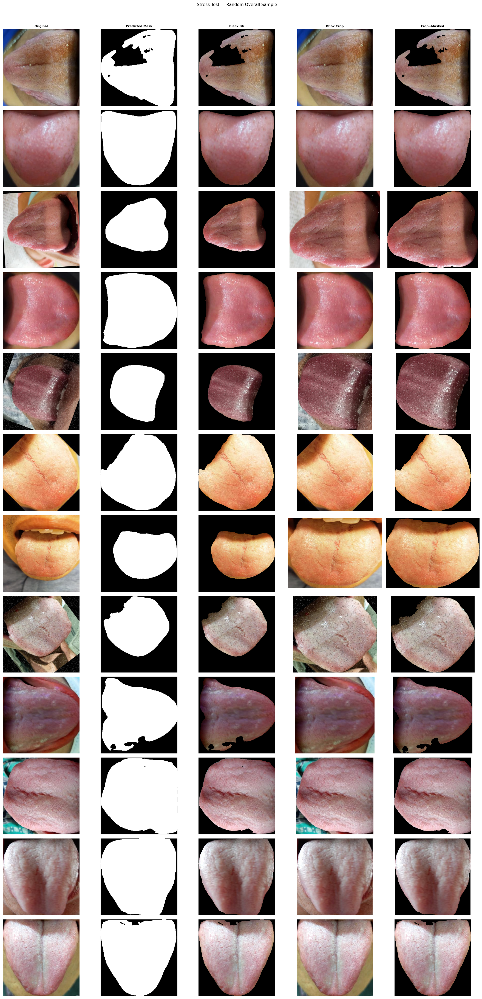

Saved -> D:\DIABETES\Segmentation_Dataset\Segmentation_Branch_Outputs\09_diabetes_stress_test\visual_audits\random_overall_stress_test_grid.png


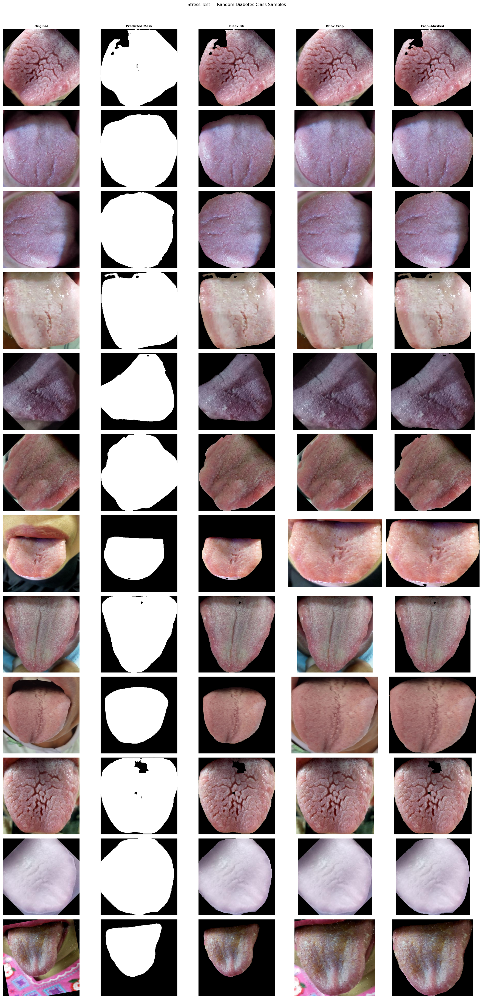

Saved -> D:\DIABETES\Segmentation_Dataset\Segmentation_Branch_Outputs\09_diabetes_stress_test\visual_audits\random_diabetes_class_grid.png
No rows for grid: Stress Test — Random Non-Diabetes Class Samples — skipped.


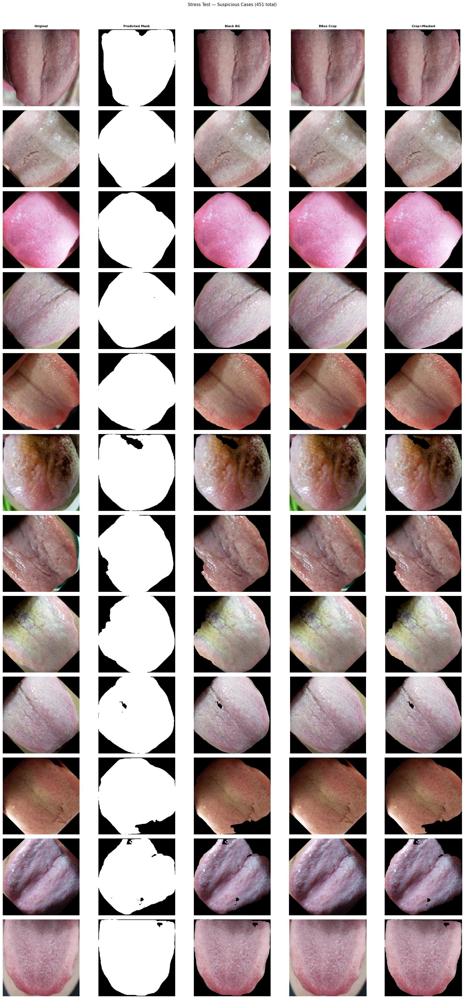

Saved -> D:\DIABETES\Segmentation_Dataset\Segmentation_Branch_Outputs\09_diabetes_stress_test\visual_audits\suspicious_cases_grid.png


In [22]:
def build_stress_grid(subset_df, title, save_path, n=12):
    """
    5-column grid: original | predicted mask | black bg | bbox crop | crop masked
    """
    if len(subset_df) == 0:
        print(f"No rows for grid: {title} — skipped.")
        return
    sample   = subset_df.sample(n=min(n, len(subset_df)), random_state=SEED).reset_index(drop=True)
    n_show   = len(sample)
    fig, axes = plt.subplots(n_show, 5, figsize=(18, n_show * 3.0), squeeze=False)
    col_hdrs  = ["Original", "Predicted Mask", "Black BG", "BBox Crop", "Crop+Masked"]
    for c, h in enumerate(col_hdrs):
        axes[0, c].set_title(h, fontsize=8, fontweight="bold")

    for i, row in sample.iterrows():
        def _safe(path, mode="RGB"):
            try:
                return np.array(Image.open(path).convert(mode))
            except Exception:
                return np.zeros((IMG_SIZE, IMG_SIZE, 3 if mode=="RGB" else 1), dtype="uint8").squeeze()

        orig      = _safe(row["image_path"])
        mask_arr  = _safe(row["pred_mask_path"], "L") if row["pred_mask_path"] else np.zeros((IMG_SIZE, IMG_SIZE), dtype="uint8")
        black_bg  = _safe(row["black_bg_path"])   if row["black_bg_path"]   else np.zeros((IMG_SIZE, IMG_SIZE, 3), dtype="uint8")
        bbox_crop = _safe(row["bbox_crop_path"])  if row["bbox_crop_path"]  else np.zeros((IMG_SIZE, IMG_SIZE, 3), dtype="uint8")
        crop_msk  = _safe(row["crop_masked_path"]) if row["crop_masked_path"] else np.zeros((IMG_SIZE, IMG_SIZE, 3), dtype="uint8")

        axes[i, 0].imshow(orig)
        axes[i, 1].imshow(mask_arr, cmap="gray", vmin=0, vmax=255)
        axes[i, 2].imshow(black_bg)
        axes[i, 3].imshow(bbox_crop)
        axes[i, 4].imshow(crop_msk)
        for c in range(5):
            axes[i, c].axis("off")
        label = (f"{row['sample_id']}\n"
                 f"cls={row['class_name']}\n"
                 f"fg={row.get('mask_foreground_ratio', 0):.3f}\n"
                 f"st={row['status'][:12]}")
        axes[i, 0].set_ylabel(label, fontsize=5, rotation=0, labelpad=75, va="center")

    fig.suptitle(title, fontsize=11, y=1.01)
    plt.tight_layout()
    plt.savefig(save_path, dpi=110, bbox_inches="tight")
    plt.show()
    print(f"Saved -> {save_path}")


# A — Random overall
build_stress_grid(
    output_df,
    title="Stress Test — Random Overall Sample",
    save_path=DIRS["visual_audits"] / "random_overall_stress_test_grid.png",
)

# B — Diabetes class
diab_df = output_df[output_df["class_name"] == "diabetes"]
build_stress_grid(
    diab_df,
    title="Stress Test — Random Diabetes Class Samples",
    save_path=DIRS["visual_audits"] / "random_diabetes_class_grid.png",
)

# C — Non-diabetes class
non_diab_df = output_df[output_df["class_name"] == "non_diabetes"]
build_stress_grid(
    non_diab_df,
    title="Stress Test — Random Non-Diabetes Class Samples",
    save_path=DIRS["visual_audits"] / "random_non_diabetes_class_grid.png",
)

# D — Suspicious cases (if any)
if len(susp_df) > 0:
    build_stress_grid(
        susp_df,
        title=f"Stress Test — Suspicious Cases ({len(susp_df)} total)",
        save_path=DIRS["visual_audits"] / "suspicious_cases_grid.png",
    )
else:
    print("No suspicious cases — suspicious_cases_grid.png not generated.")

# 14  Save Stress Test Report

In [23]:
REPORT_PATH = DIRS["reports"] / "09_diabetes_image_stress_test_report.txt"

lines = [
    "=" * 62,
    "DIABETES IMAGE STRESS TEST REPORT — EfficientNet-B0 U-Net",
    "=" * 62,
    f"  Checkpoint           : {CHECKPOINT_PATH.name}",
    f"  Device               : {DEVICE}",
    f"  IMG_SIZE             : {IMG_SIZE}",
    f"  Threshold            : {THRESHOLD}",
    f"  Largest-component    : enabled (scipy)",
    "-" * 62,
    "DATASET COUNTS",
]

for (split, cls), grp in output_df.groupby(["split_name", "class_name"]):
    lines.append(f"  {split:<8} / {cls:<15} : {len(grp)}")

lines += [
    "-" * 62,
    "RESULTS",
    f"  Total images processed    : {n_total}",
    f"  Successful (status=ok)    : {n_ok} ({100*n_ok/max(n_total,1):.1f}%)",
    f"  Failed                    : {n_failed} ({100*n_failed/max(n_total,1):.1f}%)",
    f"  Suspicious (any flag)     : {len(susp_df)} ({100*len(susp_df)/max(n_total,1):.1f}%)",
    "  Suspicious breakdown:",
    f"    suspicious_small_mask   : {n_small}",
    f"    suspicious_large_mask   : {n_large}",
    f"    suspicious_tiny_bbox    : {n_tiny_bbox}",
    f"    suspicious_edge_touch   : {n_edge}",
    "-" * 62,
    "INFERENCE TIMING",
    f"  Mean  ms/image            : {mean_ms:.2f}",
    f"  Median ms/image           : {median_ms:.2f}",
    "-" * 62,
    "IMPORTANT NOTES",
    "  - Dice/IoU NOT computed: diabetes images have no ground-truth masks.",
    "  - Class labels were NOT passed to the segmentation model.",
    "  - This notebook tests segmentation generalization only.",
    "  - No claim is made about diabetes classification improvement yet.",
    "-" * 62,
    "RECOMMENDATION",
]

pct_ok = 100 * n_ok / max(n_total, 1)
pct_susp = 100 * len(susp_df) / max(n_total, 1)

if pct_ok >= 90 and pct_susp < 10:
    lines.append("  Outputs appear visually ready for classifier preprocessing.")
    lines.append("  Manual spot-check of suspicious cases is still advised.")
elif pct_ok >= 75:
    lines.append("  Outputs are mostly usable but manual review is RECOMMENDED.")
    lines.append("  Inspect suspicious_cases/ folder and suspicious_cases_grid.png.")
else:
    lines.append("  MANUAL REVIEW REQUIRED before using outputs for classification.")
    lines.append(f"  Success rate is {pct_ok:.1f}% — investigate failure patterns.")

lines += [
    "  Reminder: this segmenter was trained on segmentation images,",
    "  NOT on diabetes images. Domain shift may cause some failures.",
    "=" * 62,
]

text = "\n".join(lines)
print(text)
with open(REPORT_PATH, "w", encoding="utf-8") as f:
    f.write(text + "\n")
print(f"\nReport saved -> {REPORT_PATH}")


DIABETES IMAGE STRESS TEST REPORT — EfficientNet-B0 U-Net
  Checkpoint           : best_efficientnetb0_unet.pth
  Device               : cuda
  IMG_SIZE             : 384
  Threshold            : 0.5
  Largest-component    : enabled (scipy)
--------------------------------------------------------------
DATASET COUNTS
  test     / diabetes        : 25
  test     / nondiabetes     : 25
  train    / diabetes        : 1556
  train    / nondiabetes     : 1552
  valid    / diabetes        : 300
  valid    / nondiabetes     : 300
--------------------------------------------------------------
RESULTS
  Total images processed    : 3758
  Successful (status=ok)    : 3307 (88.0%)
  Failed                    : 0 (0.0%)
  Suspicious (any flag)     : 451 (12.0%)
  Suspicious breakdown:
    suspicious_small_mask   : 0
    suspicious_large_mask   : 45
    suspicious_tiny_bbox    : 0
    suspicious_edge_touch   : 431
--------------------------------------------------------------
INFERENCE TIMING
  Mean

# Notebook Complete

 | Output | Path |
 |--------|------|
 | Input manifest | `09_diabetes_stress_test/manifests/diabetes_stress_test_input_manifest.csv` |
 | Output manifest | `09_diabetes_stress_test/manifests/diabetes_stress_test_output_manifest.csv` |
 | Predicted masks | `09_diabetes_stress_test/predicted_masks/<split>/<class>/` |
 | Black-BG images | `09_diabetes_stress_test/black_background/<split>/<class>/` |
 | BBox crops | `09_diabetes_stress_test/bbox_crops/<split>/<class>/` |
 | Crop+masked | `09_diabetes_stress_test/crop_masked/<split>/<class>/` |
 | Suspicious CSV | `09_diabetes_stress_test/reports/diabetes_stress_test_suspicious_cases.csv` |
 | Visual grids | `09_diabetes_stress_test/visual_audits/*.png` |
 | Report | `09_diabetes_stress_test/reports/09_diabetes_image_stress_test_report.txt` |

 **No training was performed. Diabetes dataset was not altered.**
 **Dice/IoU not computed — no ground-truth masks exist for diabetes images.**